<a href="https://colab.research.google.com/github/JD39/Complex-Networks-Bullfrog/blob/main/Bullfrog_Graph_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Initialization libraires

In [1]:
!pip install contextily
!pip install libpysal
!pip install geopandas
!pip install --upgrade scipy networkx
#!pip install 'networkx<2.7'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 KB 2.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 7.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 82.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 54.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 22.8 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found exis

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import geopandas
import contextily as ctx
import numpy as np

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
'/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias'

'/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias'


# Grafo inicial manejo del geodataframe usando geopandas



In [5]:
#gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2007.shp')
# gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2012.shp')
# gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2017.shp')
gpd = geopandas.read_file('/content/drive/MyDrive/GRECO/Grafo_Rana_Toro/Charcos_abundancias/Charcos_2022.shp')
gpd

,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Abundancia,Inv_2022,geometry
0,Agua estancada / desconocida,2085.306000,23,769323.437622,6.467164e+06,1.0,1,POINT Z (769323.438 6467163.632 0.000)
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1.0,1,POINT Z (769547.767 6467586.992 0.000)
2,Agua estancada / desconocida,304.560433,30,768083.490182,6.469770e+06,3.0,1,POINT Z (768083.490 6469770.351 0.000)
3,Agua estancada / desconocida,606.122325,26,767563.656504,6.471119e+06,NaN,0,POINT Z (767563.657 6471118.706 0.000)
4,Agua estancada / desconocida,688.826974,45,770662.490438,6.465927e+06,1.0,1,POINT Z (770662.490 6465927.436 0.000)
...,...,...,...,...,...,...,...,...
336,Selección manual,0.000000,0,772781.943330,6.467408e+06,NaN,0,POINT Z (772781.943 6467408.368 0.000)
337,Selección manual,0.000000,0,771153.165072,6.468943e+06,NaN,0,POINT Z (771153.165 6468943.483 0.000)
338,Selección manual,0.000000,0,770965.839697,6.469240e+06,NaN,0,POINT Z (770965.840 6469240.347 0.000)
339,Selección manual,0.000000,0,772485.767373,6.464875e+06,NaN,0,POINT Z (772485.767 6464874.676 0.000)


In [6]:
#gpd['Charco'].value_counts()

In [7]:
gpd['centroid'] = gpd.centroid
gpd['centroid']

0      POINT (769323.438 6467163.632)
1      POINT (769547.767 6467586.992)
2      POINT (768083.490 6469770.351)
3      POINT (767563.657 6471118.706)
4      POINT (770662.490 6465927.436)
                    ...              
336    POINT (772781.943 6467408.368)
337    POINT (771153.165 6468943.483)
338    POINT (770965.840 6469240.347)
339    POINT (772485.767 6464874.676)
340    POINT (774099.584 6463989.087)
Name: centroid, Length: 341, dtype: geometry

In [8]:
first_point = gpd['centroid'].iloc[9]
gpd['distance'] = gpd['centroid'].distance(first_point)
gpd['distance']

0      1919.583671
1      2262.375108
2      3102.234280
3      4387.203743
4      3309.209892
          ...     
336    5371.777044
337    4310.376424
338    4316.097721
339    5365.047663
340    7190.843266
Name: distance, Length: 341, dtype: float64

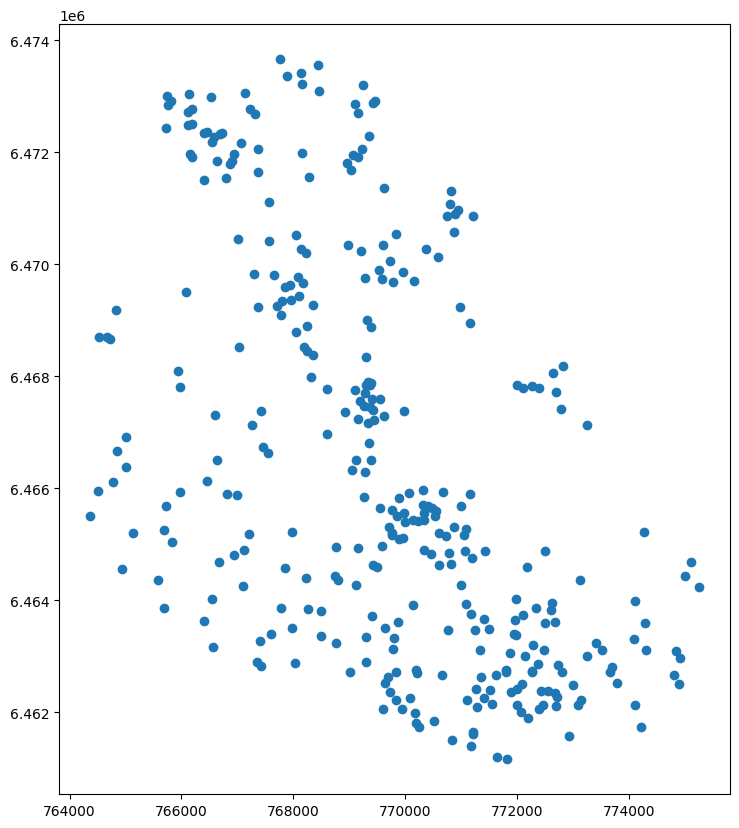

In [9]:
df=gpd
df.plot(figsize=(10, 10))
plt.show()

<Axes: >

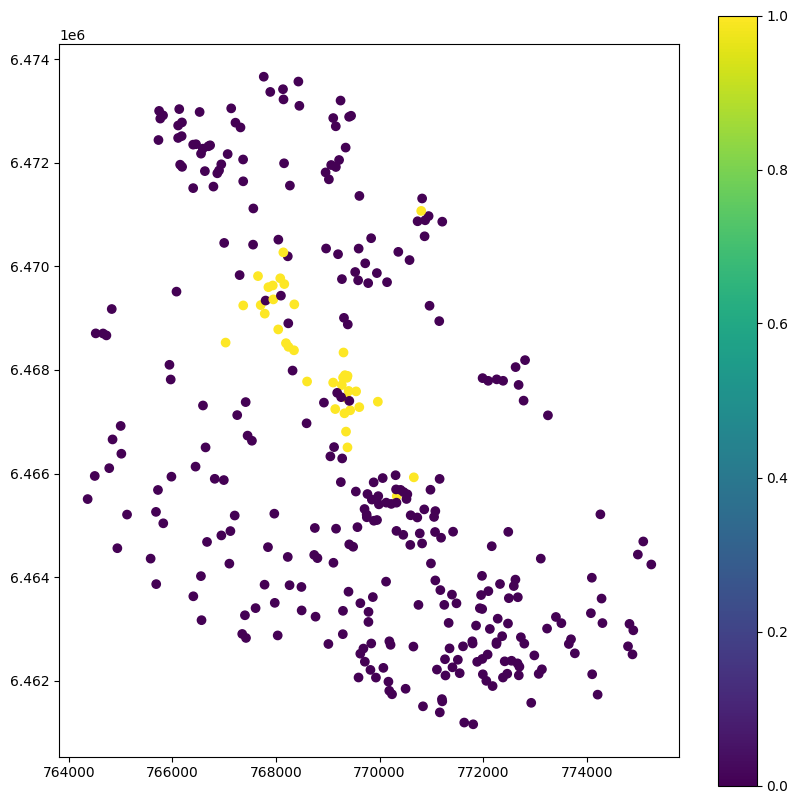

In [10]:
gdf = gpd.set_geometry("centroid")
gpd.plot("Inv_2022", legend=True, figsize=(10,10))

In [11]:
df.crs

<Projected CRS: EPSG:32721>
Name: WGS 84 / UTM zone 21S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 60°W and 54°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Falkland Islands (Malvinas). Paraguay. Uruguay.
- bounds: (-60.0, -80.0, -54.0, 0.0)
Coordinate Operation:
- name: UTM zone 21S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [12]:
# Use WGS 84 (epsg:4326) as the geographic coordinate system
df = df.to_crs(epsg=4326)
print(df.crs)
df

EPSG:4326


,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Abundancia,Inv_2022,geometry,centroid,distance
0,Agua estancada / desconocida,2085.306000,23,769323.437622,6.467164e+06,1.0,1,POINT Z (-54.15229 -31.89952 0.00000),POINT (769323.438 6467163.632),1919.583671
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1.0,1,POINT Z (-54.15004 -31.89565 0.00000),POINT (769547.767 6467586.992),2262.375108
2,Agua estancada / desconocida,304.560433,30,768083.490182,6.469770e+06,3.0,1,POINT Z (-54.16611 -31.87632 0.00000),POINT (768083.490 6469770.351),3102.234280
3,Agua estancada / desconocida,606.122325,26,767563.656504,6.471119e+06,NaN,0,POINT Z (-54.17197 -31.86429 0.00000),POINT (767563.657 6471118.706),4387.203743
4,Agua estancada / desconocida,688.826974,45,770662.490438,6.465927e+06,1.0,1,POINT Z (-54.13780 -31.91034 0.00000),POINT (770662.490 6465927.436),3309.209892
...,...,...,...,...,...,...,...,...,...,...
336,Selección manual,0.000000,0,772781.943330,6.467408e+06,NaN,0,POINT Z (-54.11583 -31.89649 0.00000),POINT (772781.943 6467408.368),5371.777044
337,Selección manual,0.000000,0,771153.165072,6.468943e+06,NaN,0,POINT Z (-54.13346 -31.88304 0.00000),POINT (771153.165 6468943.483),4310.376424
338,Selección manual,0.000000,0,770965.839697,6.469240e+06,NaN,0,POINT Z (-54.13552 -31.88041 0.00000),POINT (770965.840 6469240.347),4316.097721
339,Selección manual,0.000000,0,772485.767373,6.464875e+06,NaN,0,POINT Z (-54.11825 -31.91939 0.00000),POINT (772485.767 6464874.676),5365.047663


In [13]:
df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

# Seleccionar solo los charcos invadidos en el 2022

In [14]:
df2=df.query('Inv_2022==1')
df2

,TIPO_OBJET,ARE,Charco,x_coord,y_coord,Abundancia,Inv_2022,geometry,centroid,distance
0,Agua estancada / desconocida,2085.306000,23,769323.437622,6.467164e+06,1.0,1,POINT Z (-54.15229 -31.89952 0.00000),POINT (769323.438 6467163.632),1919.583671
1,Agua estancada / desconocida,172.531928,9,769547.766733,6.467587e+06,1.0,1,POINT Z (-54.15004 -31.89565 0.00000),POINT (769547.767 6467586.992),2262.375108
2,Agua estancada / desconocida,304.560433,30,768083.490182,6.469770e+06,3.0,1,POINT Z (-54.16611 -31.87632 0.00000),POINT (768083.490 6469770.351),3102.234280
4,Agua estancada / desconocida,688.826974,45,770662.490438,6.465927e+06,1.0,1,POINT Z (-54.13780 -31.91034 0.00000),POINT (770662.490 6465927.436),3309.209892
6,Embalse/Tajamar,143.903653,64,767028.637693,6.468529e+06,2.0,1,POINT Z (-54.17691 -31.88775 0.00000),POINT (767028.638 6468529.136),1845.635073
10,Embalse/Tajamar,472.424832,2,769364.374897,6.467458e+06,3.0,1,POINT Z (-54.15194 -31.89686 0.00000),POINT (769364.375 6467457.505),2044.298146
11,Embalse/Tajamar,940.765514,11,767705.944879,6.469253e+06,1.0,1,POINT Z (-54.16995 -31.88107 0.00000),POINT (767705.945 6469253.233),2533.010966
12,Embalse/Tajamar,525.104062,17,767653.619123,6.469813e+06,1.0,1,POINT Z (-54.17066 -31.87604 0.00000),POINT (767653.619 6469812.845),3086.481954
17,Embalse/Tajamar,2856.112062,62,769967.713972,6.467388e+06,2.0,1,POINT Z (-54.14555 -31.89734 0.00000),POINT (769967.714 6467387.942),2598.817663
18,Embalse/Tajamar,532.901110,3,768348.356612,6.468381e+06,2.0,1,POINT Z (-54.16293 -31.88878 0.00000),POINT (768348.357 6468380.579),1875.327447


In [15]:
df2['centroid2'] = df2.centroid
df2['centroid2']

<ipython-input-15-7c264bbd38e7>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df2['centroid2'] = df2.centroid
/usr/local/lib/python3.9/dist-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


0      POINT (-54.15229 -31.89952)
1      POINT (-54.15004 -31.89565)
2      POINT (-54.16611 -31.87632)
4      POINT (-54.13780 -31.91034)
6      POINT (-54.17691 -31.88775)
10     POINT (-54.15194 -31.89686)
11     POINT (-54.16995 -31.88107)
12     POINT (-54.17066 -31.87604)
17     POINT (-54.14555 -31.89734)
18     POINT (-54.16293 -31.88878)
19     POINT (-54.16460 -31.88758)
20     POINT (-54.16625 -31.88522)
21     POINT (-54.16848 -31.87792)
23     POINT (-54.14931 -31.89838)
25     POINT (-54.15299 -31.89462)
27     POINT (-54.15150 -31.90543)
28     POINT (-54.15188 -31.90269)
31     POINT (-54.15115 -31.89897)
32     POINT (-54.15277 -31.89331)
33     POINT (-54.17351 -31.88121)
34     POINT (-54.16760 -31.87760)
35     POINT (-54.16525 -31.87730)
39     POINT (-54.14119 -31.91369)
46     POINT (-54.16009 -31.89415)
48     POINT (-54.16562 -31.87179)
55     POINT (-54.15476 -31.89422)
60     POINT (-54.16310 -31.88079)
61     POINT (-54.15156 -31.89560)
63     POINT (-54.15

In [16]:
df2.columns

Index(['TIPO_OBJET', 'ARE', 'Charco', 'x_coord', 'y_coord', 'Abundancia',
       'Inv_2022', 'geometry', 'centroid', 'distance', 'centroid2'],
      dtype='object')

In [17]:
df2['distance'].mean()

2450.9910506375195

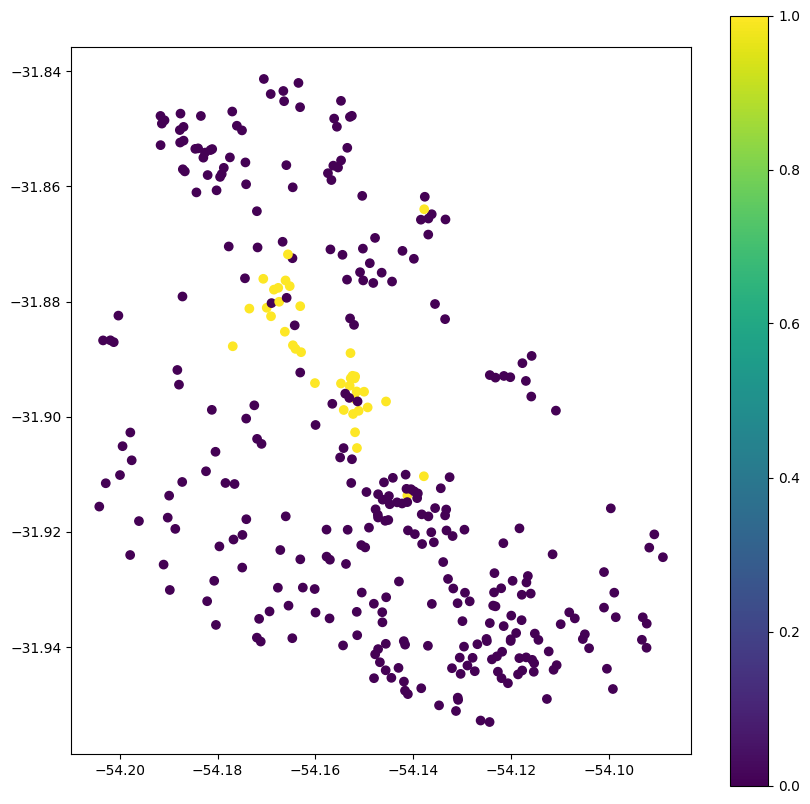

In [18]:
df.plot("Inv_2022", legend=True, figsize=(10, 10))
plt.show()


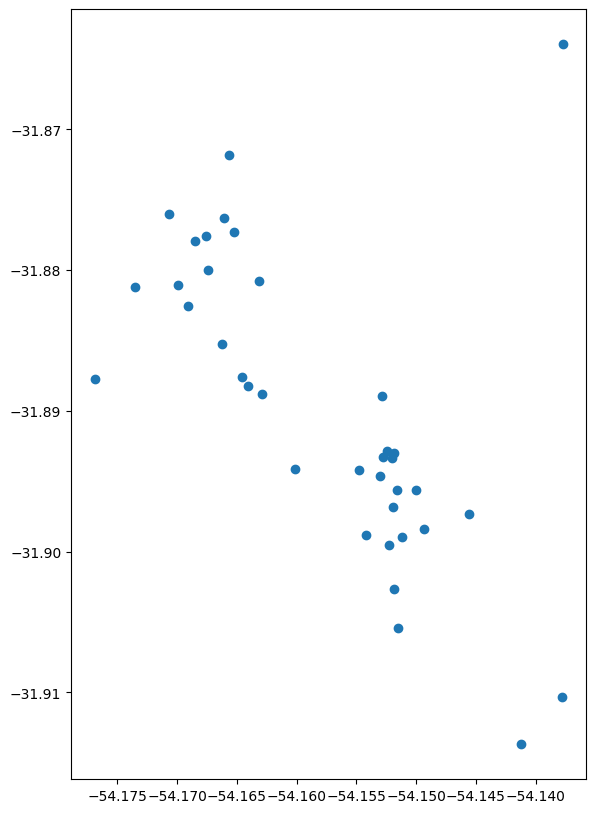

In [19]:
df2.plot(legend=True, figsize=(10, 10))
plt.show()

In [20]:
coordinates = np.column_stack((df2.geometry.x, df2.geometry.y))
coordinates

array([[-54.15229267, -31.89951532],
       [-54.15004085, -31.89564738],
       [-54.16610957, -31.87631946],
       [-54.13780417, -31.91033632],
       [-54.17690736, -31.88775204],
       [-54.15194188, -31.89685761],
       [-54.16995385, -31.88106806],
       [-54.17066068, -31.87603773],
       [-54.14555002, -31.89734135],
       [-54.16292848, -31.88878012],
       [-54.16460063, -31.88757725],
       [-54.1662496 , -31.88522498],
       [-54.1684808 , -31.87791694],
       [-54.14930648, -31.89837522],
       [-54.15298687, -31.89461681],
       [-54.15149976, -31.90543136],
       [-54.15188393, -31.90269001],
       [-54.15115334, -31.89896649],
       [-54.15276887, -31.8933096 ],
       [-54.17351282, -31.88121081],
       [-54.16760134, -31.87760352],
       [-54.16525433, -31.87730315],
       [-54.14118734, -31.91368984],
       [-54.1600902 , -31.89415196],
       [-54.16561924, -31.87179039],
       [-54.15476459, -31.89422004],
       [-54.16310479, -31.8807915 ],
 

Ingreso el origen de la invasion: criadero Acegua

In [21]:
coordinates_origen=np.append(coordinates, [[-54.154538, -31.893438]], axis=0)
coordinates_origen

array([[-54.15229267, -31.89951532],
       [-54.15004085, -31.89564738],
       [-54.16610957, -31.87631946],
       [-54.13780417, -31.91033632],
       [-54.17690736, -31.88775204],
       [-54.15194188, -31.89685761],
       [-54.16995385, -31.88106806],
       [-54.17066068, -31.87603773],
       [-54.14555002, -31.89734135],
       [-54.16292848, -31.88878012],
       [-54.16460063, -31.88757725],
       [-54.1662496 , -31.88522498],
       [-54.1684808 , -31.87791694],
       [-54.14930648, -31.89837522],
       [-54.15298687, -31.89461681],
       [-54.15149976, -31.90543136],
       [-54.15188393, -31.90269001],
       [-54.15115334, -31.89896649],
       [-54.15276887, -31.8933096 ],
       [-54.17351282, -31.88121081],
       [-54.16760134, -31.87760352],
       [-54.16525433, -31.87730315],
       [-54.14118734, -31.91368984],
       [-54.1600902 , -31.89415196],
       [-54.16561924, -31.87179039],
       [-54.15476459, -31.89422004],
       [-54.16310479, -31.8807915 ],
 

## Generando grafos desde geopuntos

In [22]:
from libpysal import weights, examples
from contextily import add_basemap
#from scipy.sparse import sparse_array
## 3-nearest neighbor graph, meaning that points are connected
## to the three closest other points. This means every point
## will have exactly three neighbors.
knn3 = weights.KNN.from_dataframe(df2, k=3, p=1)

##Distand band degree 0,001 grad= 111,3 m, 0,006=667.8, 0.00628
dist = weights.DistanceBand.from_array(coordinates_origen, threshold=0.006289, p=1, binary=False)

# Then, we can convert the graph to networkx object using the
# .to_networkx() method.
knn_graph = knn3.to_networkx()
dist_graph = dist.to_networkx()

/usr/local/lib/python3.9/dist-packages/scipy/sparse/_data.py:117: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)
/usr/local/lib/python3.9/dist-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There are 4 islands with ids: 3, 4, 22, 36.
  warnings.warn(message)


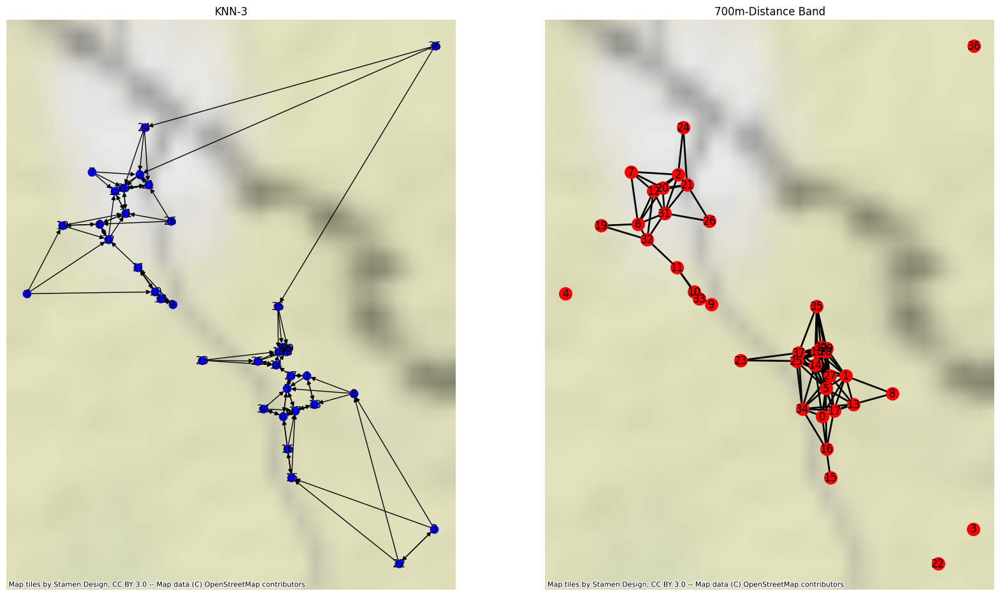

In [23]:

positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=10, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("KNN-3", "700m-Distance Band")[i])
    #facet.axis("off") 
nx.draw(knn_graph, positions, ax=ax[0], node_size=80, node_color="b",  with_labels='Charco') ##, with_labels='inv'
nx.draw(dist_graph, positions, ax=ax[1], node_size=200, node_color="r",  with_labels='Charco', width=2  )
plt.show()

In [24]:
positions

{0: array([-54.15229267, -31.89951532]),
 1: array([-54.15004085, -31.89564738]),
 2: array([-54.16610957, -31.87631946]),
 3: array([-54.13780417, -31.91033632]),
 4: array([-54.17690736, -31.88775204]),
 5: array([-54.15194188, -31.89685761]),
 6: array([-54.16995385, -31.88106806]),
 7: array([-54.17066068, -31.87603773]),
 8: array([-54.14555002, -31.89734135]),
 9: array([-54.16292848, -31.88878012]),
 10: array([-54.16460063, -31.88757725]),
 11: array([-54.1662496 , -31.88522498]),
 12: array([-54.1684808 , -31.87791694]),
 13: array([-54.14930648, -31.89837522]),
 14: array([-54.15298687, -31.89461681]),
 15: array([-54.15149976, -31.90543136]),
 16: array([-54.15188393, -31.90269001]),
 17: array([-54.15115334, -31.89896649]),
 18: array([-54.15276887, -31.8933096 ]),
 19: array([-54.17351282, -31.88121081]),
 20: array([-54.16760134, -31.87760352]),
 21: array([-54.16525433, -31.87730315]),
 22: array([-54.14118734, -31.91368984]),
 23: array([-54.1600902 , -31.89415196]),
 2

In [25]:
dist_graph.edges

EdgeView([(0, 1), (0, 5), (0, 13), (0, 14), (0, 16), (0, 17), (0, 27), (0, 34), (1, 5), (1, 8), (1, 13), (1, 14), (1, 17), (1, 18), (1, 25), (1, 27), (1, 28), (1, 29), (1, 30), (2, 7), (2, 12), (2, 20), (2, 21), (2, 24), (2, 31), (5, 13), (5, 14), (5, 16), (5, 17), (5, 18), (5, 25), (5, 27), (5, 28), (5, 29), (5, 30), (5, 34), (5, 37), (6, 7), (6, 12), (6, 19), (6, 20), (6, 31), (6, 32), (7, 12), (7, 20), (8, 13), (9, 10), (9, 33), (10, 11), (10, 33), (11, 32), (11, 33), (12, 20), (12, 21), (12, 31), (12, 32), (13, 17), (13, 27), (13, 34), (14, 17), (14, 18), (14, 25), (14, 27), (14, 28), (14, 29), (14, 30), (14, 34), (14, 35), (14, 37), (15, 16), (16, 17), (16, 34), (17, 27), (17, 34), (18, 25), (18, 27), (18, 28), (18, 29), (18, 30), (18, 35), (18, 37), (19, 32), (20, 21), (20, 31), (21, 24), (21, 26), (21, 31), (23, 25), (23, 37), (25, 27), (25, 28), (25, 29), (25, 30), (25, 34), (25, 37), (26, 31), (27, 28), (27, 29), (27, 30), (27, 34), (27, 37), (28, 29), (28, 30), (28, 35), (28,

In [26]:
positions

{0: array([-54.15229267, -31.89951532]),
 1: array([-54.15004085, -31.89564738]),
 2: array([-54.16610957, -31.87631946]),
 3: array([-54.13780417, -31.91033632]),
 4: array([-54.17690736, -31.88775204]),
 5: array([-54.15194188, -31.89685761]),
 6: array([-54.16995385, -31.88106806]),
 7: array([-54.17066068, -31.87603773]),
 8: array([-54.14555002, -31.89734135]),
 9: array([-54.16292848, -31.88878012]),
 10: array([-54.16460063, -31.88757725]),
 11: array([-54.1662496 , -31.88522498]),
 12: array([-54.1684808 , -31.87791694]),
 13: array([-54.14930648, -31.89837522]),
 14: array([-54.15298687, -31.89461681]),
 15: array([-54.15149976, -31.90543136]),
 16: array([-54.15188393, -31.90269001]),
 17: array([-54.15115334, -31.89896649]),
 18: array([-54.15276887, -31.8933096 ]),
 19: array([-54.17351282, -31.88121081]),
 20: array([-54.16760134, -31.87760352]),
 21: array([-54.16525433, -31.87730315]),
 22: array([-54.14118734, -31.91368984]),
 23: array([-54.1600902 , -31.89415196]),
 2

In [27]:
min_thr = weights.min_threshold_distance(coordinates)
min_thr

0.028967278326662706

In [28]:
w_min_dist = weights.DistanceBand.from_dataframe(df, min_thr, binary=False)
w_min_dist

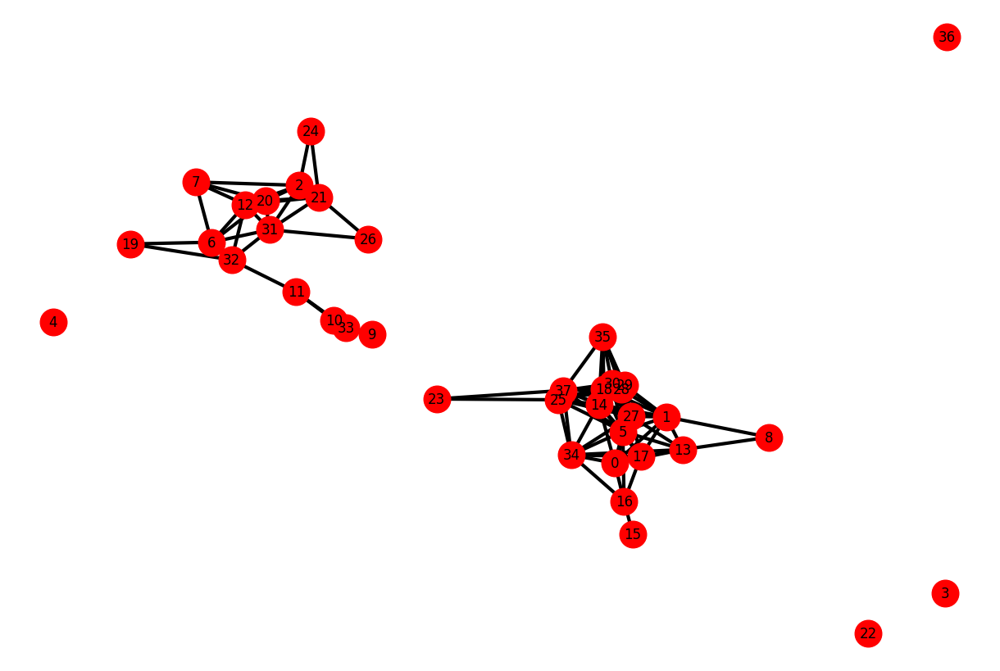

In [29]:
#nx.draw(knn_graph, positions, node_size=60, node_color="b")
plt.figure(figsize=(12, 8))
nx.draw(dist_graph, positions, node_size=550, node_color="r",with_labels=True,  width=3)
plt.show()

In [30]:
dist_graph.degree

DegreeView({0: 8, 1: 12, 2: 6, 3: 0, 4: 0, 5: 14, 6: 6, 7: 4, 8: 2, 9: 2, 10: 3, 11: 3, 12: 7, 13: 7, 14: 13, 15: 1, 16: 5, 17: 8, 18: 10, 19: 2, 20: 6, 21: 6, 22: 0, 23: 2, 24: 2, 25: 11, 26: 2, 27: 13, 28: 10, 29: 10, 30: 10, 31: 7, 32: 5, 33: 3, 34: 9, 35: 6, 36: 0, 37: 11})

In [31]:
dist_graph.edges

EdgeView([(0, 1), (0, 5), (0, 13), (0, 14), (0, 16), (0, 17), (0, 27), (0, 34), (1, 5), (1, 8), (1, 13), (1, 14), (1, 17), (1, 18), (1, 25), (1, 27), (1, 28), (1, 29), (1, 30), (2, 7), (2, 12), (2, 20), (2, 21), (2, 24), (2, 31), (5, 13), (5, 14), (5, 16), (5, 17), (5, 18), (5, 25), (5, 27), (5, 28), (5, 29), (5, 30), (5, 34), (5, 37), (6, 7), (6, 12), (6, 19), (6, 20), (6, 31), (6, 32), (7, 12), (7, 20), (8, 13), (9, 10), (9, 33), (10, 11), (10, 33), (11, 32), (11, 33), (12, 20), (12, 21), (12, 31), (12, 32), (13, 17), (13, 27), (13, 34), (14, 17), (14, 18), (14, 25), (14, 27), (14, 28), (14, 29), (14, 30), (14, 34), (14, 35), (14, 37), (15, 16), (16, 17), (16, 34), (17, 27), (17, 34), (18, 25), (18, 27), (18, 28), (18, 29), (18, 30), (18, 35), (18, 37), (19, 32), (20, 21), (20, 31), (21, 24), (21, 26), (21, 31), (23, 25), (23, 37), (25, 27), (25, 28), (25, 29), (25, 30), (25, 34), (25, 37), (26, 31), (27, 28), (27, 29), (27, 30), (27, 34), (27, 37), (28, 29), (28, 30), (28, 35), (28,

# Caracteriticas del grafo 2022

In [32]:
G=dist_graph
#G=knn_graph  

In [33]:
G.nodes

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37))

In [34]:
G.edges

EdgeView([(0, 1), (0, 5), (0, 13), (0, 14), (0, 16), (0, 17), (0, 27), (0, 34), (1, 5), (1, 8), (1, 13), (1, 14), (1, 17), (1, 18), (1, 25), (1, 27), (1, 28), (1, 29), (1, 30), (2, 7), (2, 12), (2, 20), (2, 21), (2, 24), (2, 31), (5, 13), (5, 14), (5, 16), (5, 17), (5, 18), (5, 25), (5, 27), (5, 28), (5, 29), (5, 30), (5, 34), (5, 37), (6, 7), (6, 12), (6, 19), (6, 20), (6, 31), (6, 32), (7, 12), (7, 20), (8, 13), (9, 10), (9, 33), (10, 11), (10, 33), (11, 32), (11, 33), (12, 20), (12, 21), (12, 31), (12, 32), (13, 17), (13, 27), (13, 34), (14, 17), (14, 18), (14, 25), (14, 27), (14, 28), (14, 29), (14, 30), (14, 34), (14, 35), (14, 37), (15, 16), (16, 17), (16, 34), (17, 27), (17, 34), (18, 25), (18, 27), (18, 28), (18, 29), (18, 30), (18, 35), (18, 37), (19, 32), (20, 21), (20, 31), (21, 24), (21, 26), (21, 31), (23, 25), (23, 37), (25, 27), (25, 28), (25, 29), (25, 30), (25, 34), (25, 37), (26, 31), (27, 28), (27, 29), (27, 30), (27, 34), (27, 37), (28, 29), (28, 30), (28, 35), (28,

Feauteres of graph

In [35]:
print('num of nodes: {}'.format(G.number_of_nodes()))
print('num of edges: {}'.format(G.number_of_edges()))
G_deg = nx.degree_histogram(G)
G_deg_sum = [a * b for a, b in zip(G_deg, range(0, len(G_deg)))]
print('average degree: {}'.format(sum(G_deg_sum) / G.number_of_nodes()))
G_cluster = sorted(list(nx.clustering(G).values()))
print('average clustering coefficient: {}'.format(sum(G_cluster) / len(G_cluster)))
#print("SCC: ", nx.number_strongly_connected_components(G))
#print("WCC: ", nx.number_weakly_connected_components(G))
#print('average_shortest_path_length:', nx.average_shortest_path_length(G))
#print('triangles:', sum(nx.triangles(G).values()) / 3 )
print('density:', nx.density(G))


num of nodes: 38
num of edges: 113
average degree: 5.947368421052632
average clustering coefficient: 0.6460367118261856
density: 0.16073968705547653


In [36]:
# Clustering coefficient of a specific node
print(nx.clustering(G, 9))

1.0


In [37]:
def avg_neigh_degree(g):
    return dict((n,float(sum(g.degree(i) for i in g[n]))/ g.degree(n))
    for n in g.nodes() if g.degree(n))

In [38]:
avg_neigh_degree(G)

{0: 10.125,
 1: 9.666666666666666,
 2: 5.333333333333333,
 5: 9.785714285714286,
 6: 5.166666666666667,
 7: 6.25,
 8: 9.5,
 9: 3.0,
 10: 2.6666666666666665,
 11: 3.6666666666666665,
 12: 5.714285714285714,
 13: 9.428571428571429,
 14: 10.153846153846153,
 15: 5.0,
 16: 8.0,
 17: 10.125,
 18: 11.0,
 19: 5.5,
 20: 6.0,
 21: 5.0,
 23: 11.0,
 24: 6.0,
 25: 10.363636363636363,
 26: 6.5,
 27: 10.23076923076923,
 28: 11.0,
 29: 11.0,
 30: 11.0,
 31: 5.428571428571429,
 32: 5.0,
 33: 2.6666666666666665,
 34: 10.0,
 35: 10.666666666666666,
 37: 9.818181818181818}

In [39]:
#centrality
bet_cen = nx.betweenness_centrality(G)
clo_cen = nx.closeness_centrality(G)

In [40]:
nx.number_of_isolates(G)

4

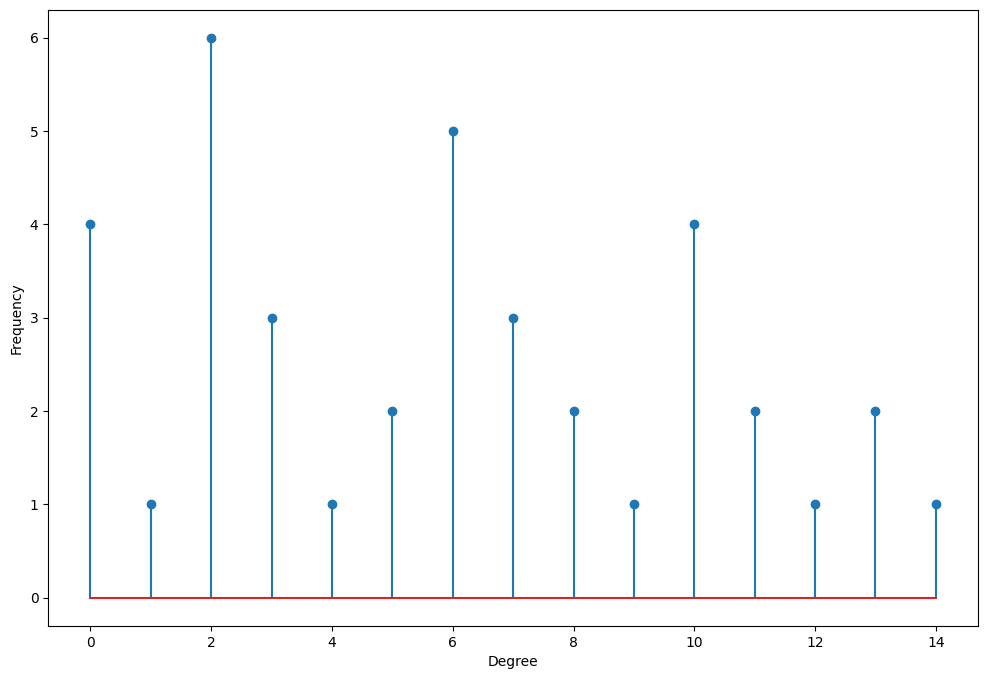

In [41]:
# Degree histogram
import numpy as np
degree_freq = np.array(nx.degree_histogram(G)).astype('float')
plt.figure(figsize=(12, 8))
plt.stem(degree_freq)
plt.ylabel("Frequency")
plt.xlabel("Degree")
plt.show()

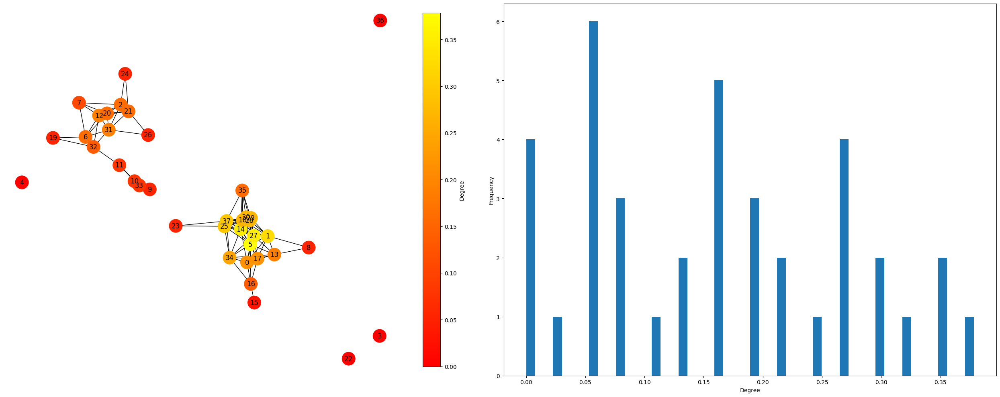

In [42]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
lcc= nx.degree_centrality(G)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Degree')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

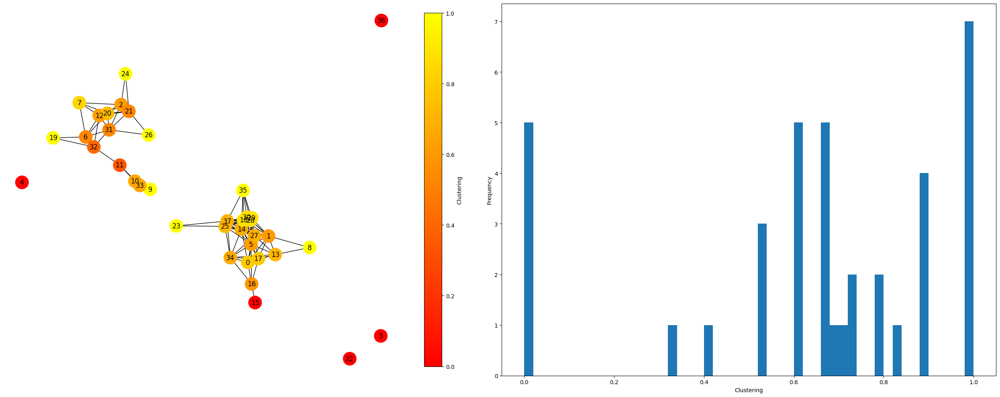

In [43]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Clustering')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

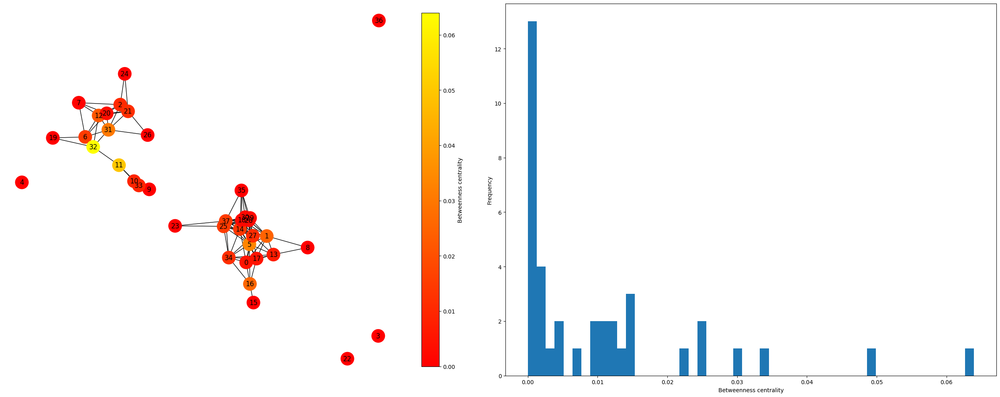

In [44]:
#Clustering coefficient and clustering histogram
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
lcc=nx.betweenness_centrality(G)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Betweenness centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Betweenness centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

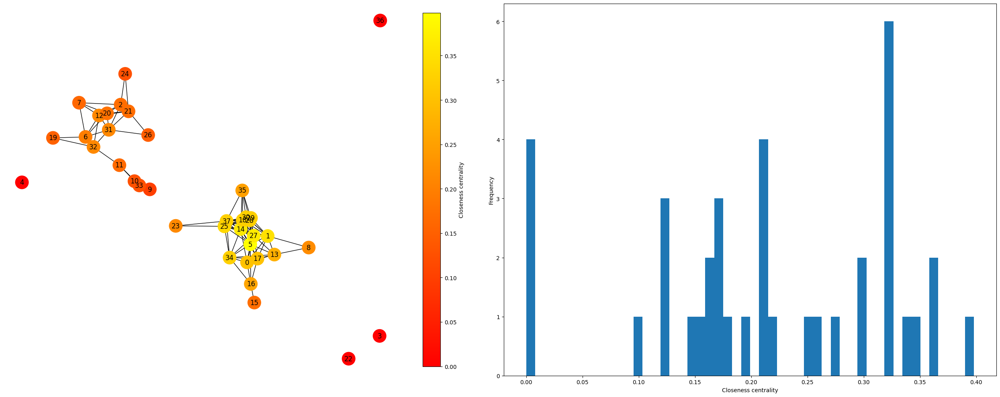

In [45]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
#lcc=nx.betweenness_centrality(gc)
lcc= nx.closeness_centrality(G)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G,positions, node_color=node_colors,node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Closeness centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Closeness centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

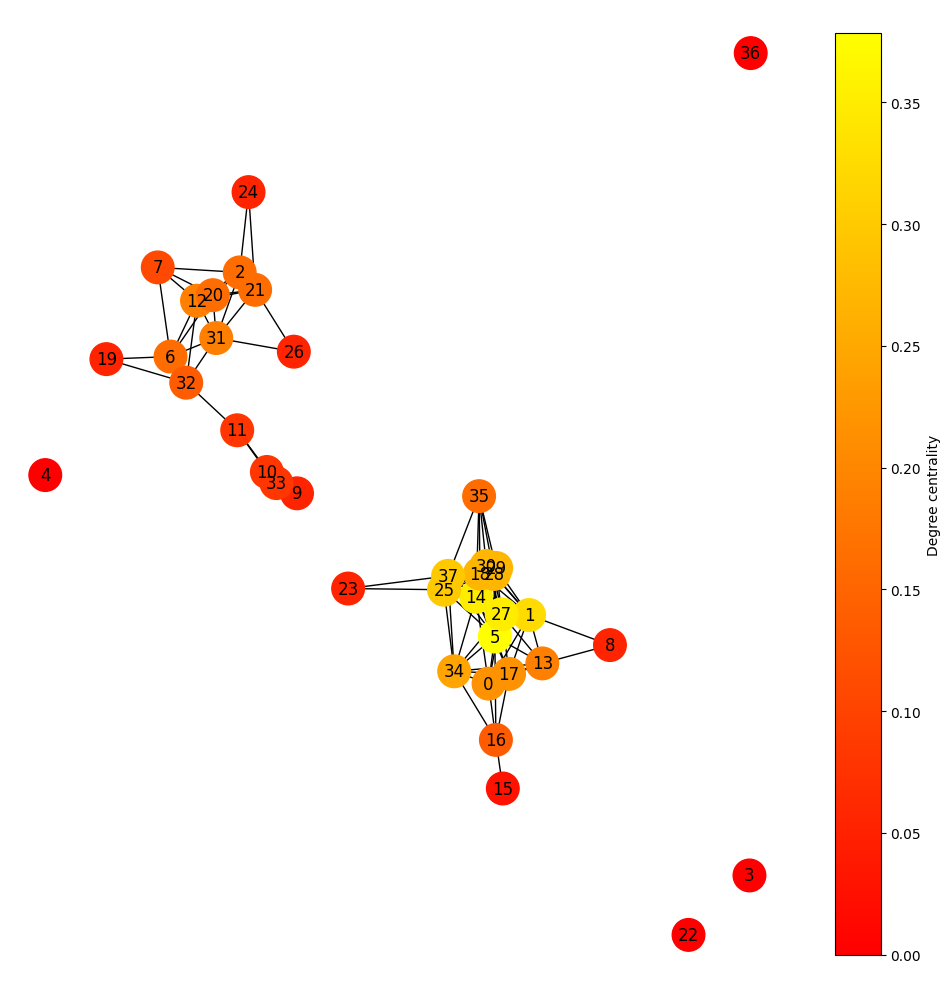

In [46]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
#lcc = nx.clustering(gc)
#lcc=nx.betweenness_centrality(gc)
#lcc= nx.closeness_centrality(gc)
lcc= nx.degree_centrality(G)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 10))

nx.draw(G, positions, node_color=node_colors, node_size=550, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree centrality', shrink=0.95, ax=ax1)

# ax2.hist(lcc.values(), bins=50)
# ax2.set_xlabel('Degree centrality')
# ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [47]:
G_cluster = sorted(list(nx.clustering(G).values()))
print('average clustering coefficient: {}'.format(sum(G_cluster) / len(G_cluster)))

average clustering coefficient: 0.6460367118261856


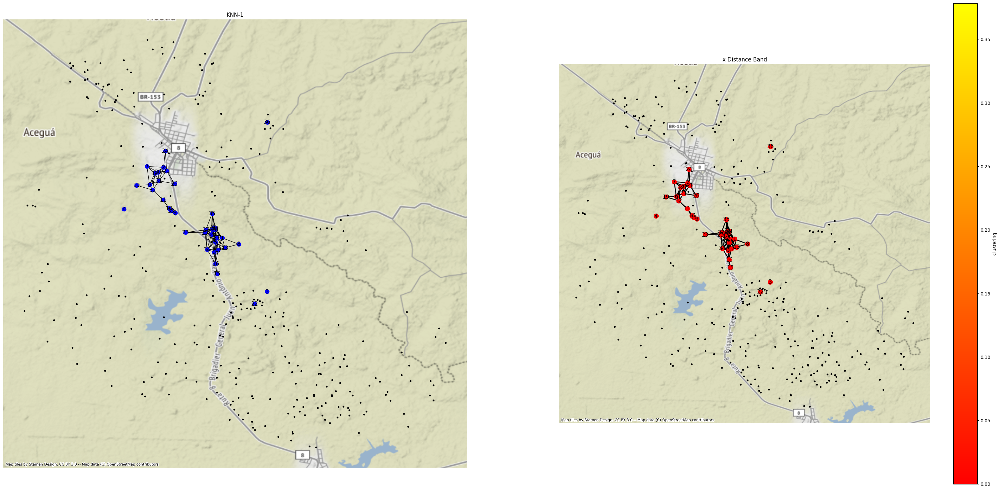

In [48]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("KNN-1", "x Distance Band")[i])
    #facet.axis("off") 
nx.draw(dist_graph, positions, ax=ax[0], node_size=80, node_color="b",  with_labels='Charco') ##, with_labels='inv'
nx.draw(dist_graph, positions, ax=ax[1], node_size=100, node_color='r',  with_labels='Charco', width=2  )
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax[1])
plt.show()

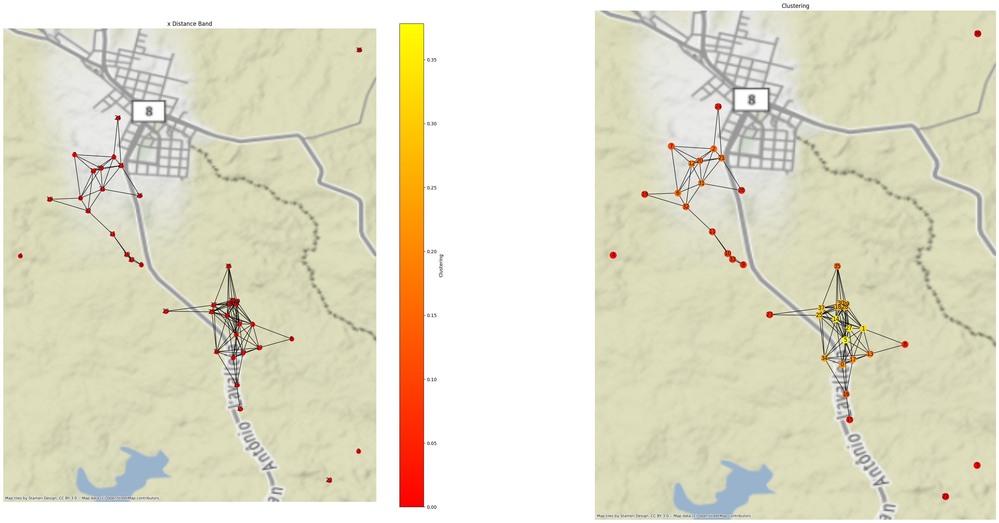

In [49]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Clustering" )[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[0], node_size=90, node_color="r", with_labels='Inv')
nx.draw(G, positions, ax=ax[1], node_size=200, node_color=node_colors, with_labels='Inv')
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.95, ax=ax[0])
plt.show()

In [50]:
def plot_degree_dist_directed(G,bins):
    degrees = [G.degree(n) for n in G.nodes()]
    ent = pd.DataFrame(dict(deg_in = [G.in_degree(n) for n in G.nodes()]))
    sai = pd.DataFrame(dict(deg_out = [G.out_degree(n) for n in G.nodes()]))
    
    plt.figure(figsize=(20,10))
    fig, axes = plt.subplots(1, 2)

    ent.hist('deg_in', bins=20, ax=axes[0])
    sai.hist('deg_out', bins=20, ax=axes[1])

    axes[0].set_ylabel('Frecuency')
    axes[1].set_ylabel('Frecuency')

    axes[0].set_xlabel('$k_{in}$')
    axes[1].set_xlabel('$k_{out}$')

    plt.show()

In [51]:
nx.degree_pearson_correlation_coefficient(G)

0.5030999918061891

# Buscando Comunidades

In [52]:
!pip install python-louvain
from community import community_louvain
import matplotlib.cm as cm
#from networkx.algorithms import community
#from networkx.algorithms.community.centrality import girvan_newman
partition = community_louvain.best_partition(G)
values = [partition.get(node) for node in G.nodes()]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


<ipython-input-53-ab38a01b83a6>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


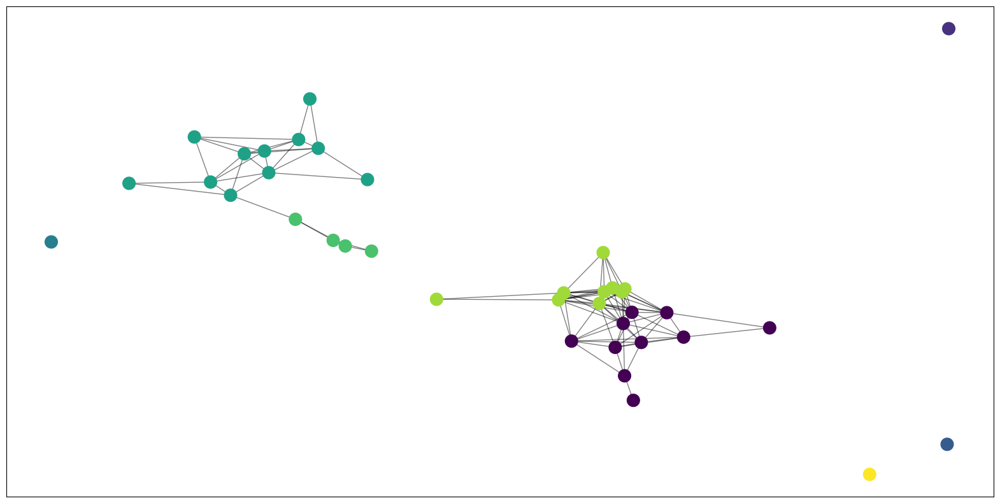

In [53]:
plt.figure(figsize=(20, 10))
#pos = nx.spring_layout(G, seed=1)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, positions, partition.keys(), node_size=200, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, positions, alpha=0.5)
plt.show()

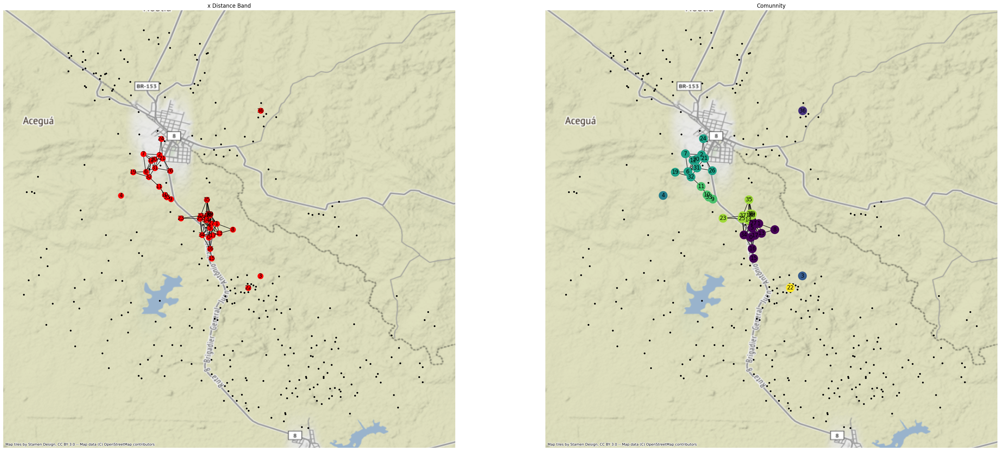

In [54]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Comunnity")[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[1], node_size=350, node_color=list(partition.values()), with_labels='inv')
nx.draw(G, positions, ax=ax[0], node_size=150, node_color="r", with_labels='Charco')
plt.show()

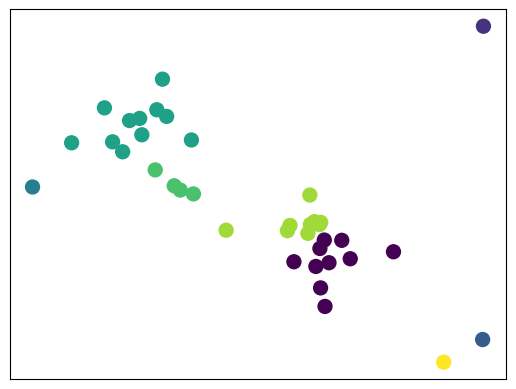

In [55]:
nx.draw_networkx_nodes(values, positions, partition.keys(), node_size=100,cmap=cmap, node_color=list(values))

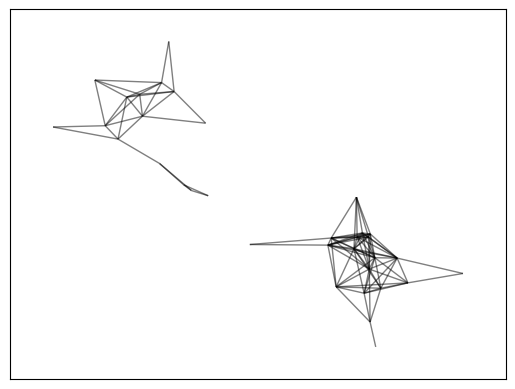

In [56]:
nx.draw_networkx_edges(G, positions, alpha=0.5)

In [57]:
positions

{0: array([-54.15229267, -31.89951532]),
 1: array([-54.15004085, -31.89564738]),
 2: array([-54.16610957, -31.87631946]),
 3: array([-54.13780417, -31.91033632]),
 4: array([-54.17690736, -31.88775204]),
 5: array([-54.15194188, -31.89685761]),
 6: array([-54.16995385, -31.88106806]),
 7: array([-54.17066068, -31.87603773]),
 8: array([-54.14555002, -31.89734135]),
 9: array([-54.16292848, -31.88878012]),
 10: array([-54.16460063, -31.88757725]),
 11: array([-54.1662496 , -31.88522498]),
 12: array([-54.1684808 , -31.87791694]),
 13: array([-54.14930648, -31.89837522]),
 14: array([-54.15298687, -31.89461681]),
 15: array([-54.15149976, -31.90543136]),
 16: array([-54.15188393, -31.90269001]),
 17: array([-54.15115334, -31.89896649]),
 18: array([-54.15276887, -31.8933096 ]),
 19: array([-54.17351282, -31.88121081]),
 20: array([-54.16760134, -31.87760352]),
 21: array([-54.16525433, -31.87730315]),
 22: array([-54.14118734, -31.91368984]),
 23: array([-54.1600902 , -31.89415196]),
 2

# Pruebas 

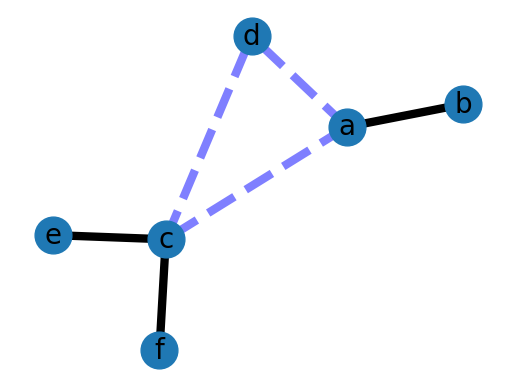

In [58]:
# Author: Aric Hagberg (hagberg@lanl.gov)
import matplotlib.pyplot as plt
import networkx as nx

G = nx.Graph()

G.add_edge('a', 'b', weight=0.6)
G.add_edge('a', 'c', weight=0.2)
G.add_edge('c', 'd', weight=0.1)
G.add_edge('c', 'e', weight=0.7)
G.add_edge('c', 'f', weight=0.9)
G.add_edge('a', 'd', weight=0.3)

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.5]

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=700)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=6)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=6, alpha=0.5, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()

source vertex {target:length, }
0 {0: 0, 1: 1, 5: 1, 13: 1, 14: 1, 16: 1, 17: 1, 27: 1, 34: 1, 8: 2, 18: 2, 25: 2, 28: 2, 29: 2, 30: 2, 37: 2, 35: 2, 15: 2, 23: 3} 
1 {1: 0, 0: 1, 5: 1, 8: 1, 13: 1, 14: 1, 17: 1, 18: 1, 25: 1, 27: 1, 28: 1, 29: 1, 30: 1, 16: 2, 34: 2, 37: 2, 35: 2, 23: 2, 15: 3} 
5 {5: 0, 0: 1, 1: 1, 13: 1, 14: 1, 16: 1, 17: 1, 18: 1, 25: 1, 27: 1, 28: 1, 29: 1, 30: 1, 34: 1, 37: 1, 8: 2, 35: 2, 15: 2, 23: 2} 
8 {8: 0, 1: 1, 13: 1, 0: 2, 5: 2, 14: 2, 17: 2, 18: 2, 25: 2, 27: 2, 28: 2, 29: 2, 30: 2, 34: 2, 16: 3, 37: 3, 35: 3, 23: 3, 15: 4} 
13 {13: 0, 0: 1, 1: 1, 5: 1, 8: 1, 17: 1, 27: 1, 34: 1, 14: 2, 16: 2, 18: 2, 25: 2, 28: 2, 29: 2, 30: 2, 37: 2, 35: 3, 15: 3, 23: 3} 
14 {14: 0, 0: 1, 1: 1, 5: 1, 17: 1, 18: 1, 25: 1, 27: 1, 28: 1, 29: 1, 30: 1, 34: 1, 35: 1, 37: 1, 13: 2, 16: 2, 8: 2, 23: 2, 15: 3} 
15 {15: 0, 16: 1, 0: 2, 5: 2, 17: 2, 34: 2, 1: 3, 13: 3, 14: 3, 27: 3, 18: 3, 25: 3, 28: 3, 29: 3, 30: 3, 37: 3, 8: 4, 35: 4, 23: 4} 
16 {16: 0, 0: 1, 5: 1, 15: 1, 17: 

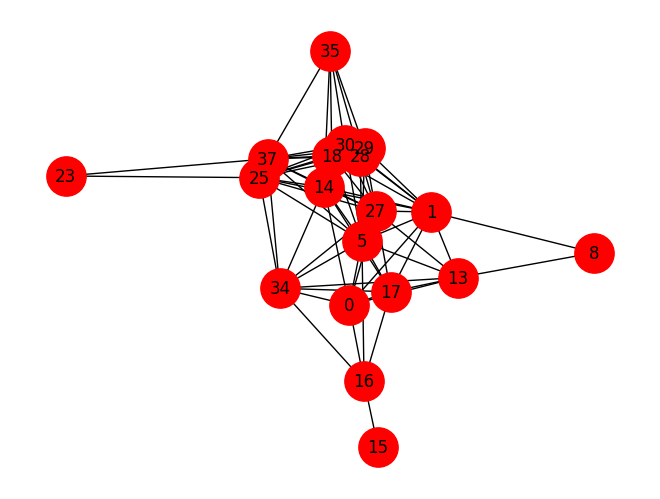

In [59]:
#    Copyright (C) 2004-2019 by
#    Aric Hagberg <hagberg@lanl.gov>
#    Dan Schult <dschult@colgate.edu>
#    Pieter Swart <swart@lanl.gov>
#    All rights reserved.
#    BSD license.


#G = nx.lollipop_graph(4, 6)
G=dist_graph.subgraph(max(nx.connected_components(dist_graph)))

pathlengths = []

print("source vertex {target:length, }")
for v in G.nodes():
    spl = dict(nx.single_source_shortest_path_length(G, v))
    print('{} {} '.format(v, spl))
    for p in spl:
        pathlengths.append(spl[p])

print('')
print("average shortest path length %s" % (sum(pathlengths) / len(pathlengths)))

# histogram of path lengths
dist = {}
for p in pathlengths:
    if p in dist:
        dist[p] += 1
    else:
        dist[p] = 1

print('')
print("length #paths")
verts = dist.keys()
for d in sorted(verts):
    print('%s %d' % (d, dist[d]))

print("radius: %d" % nx.radius(G))
print("diameter: %d" % nx.diameter(G))
print("eccentricity: %s" % nx.eccentricity(G))
print("center: %s" % nx.center(G))
print("periphery: %s" % nx.periphery(G))
print("density: %s" % nx.density(G))

nx.draw(G, positions, node_size=800, with_labels=True, node_color='r')
plt.show()

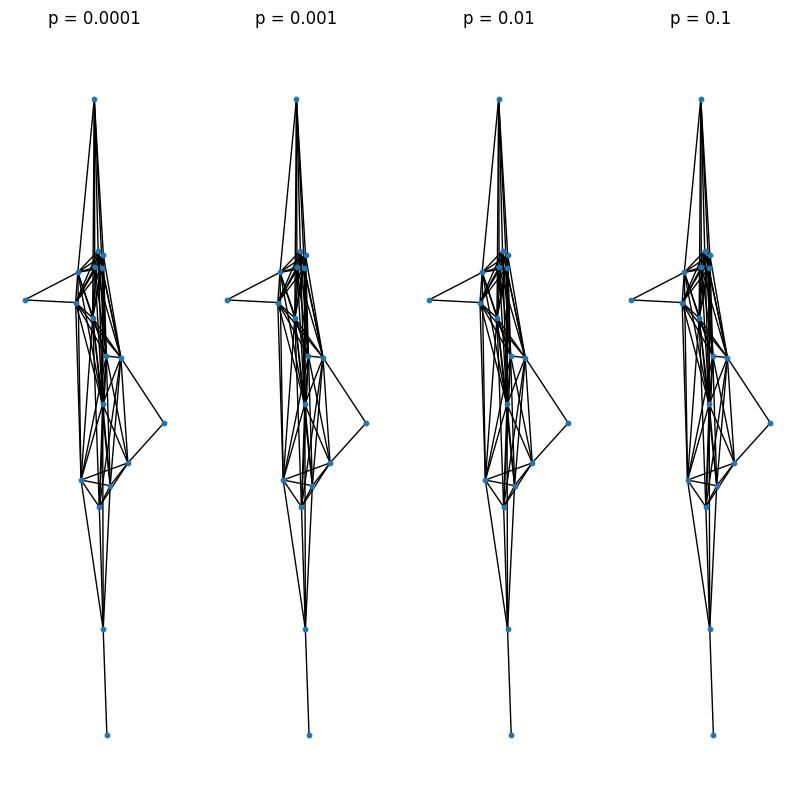

In [60]:
from pylab import *
fig = plt.figure("Percolation", figsize=(10, 10))
for i, p in [(1, 0.0001), (2, 0.001), (3, 0.01), (4, 0.1)]: 
   subplot(1, 4, i)
   title( 'p = ' + str(p))
   #G=dist_graph
#g = nx.erdos_renyi_graph(100, p)
   nx.draw(G, positions, node_size = 10)

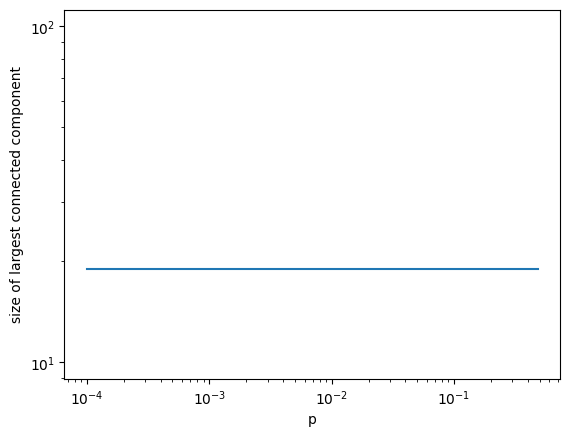

In [61]:
from pylab import *
p = 0.0001
pdata = []
gdata = []
while p < 0.5:
   pdata.append(p)
    #g = nx.erdos_renyi_graph(100, p)
   ccs = nx.connected_components(dist_graph)
   gdata.append(max(len(cc) for cc in ccs))
   p *= 1.1

loglog(pdata, gdata)
xlabel('p')
ylabel('size of largest connected component')
show()

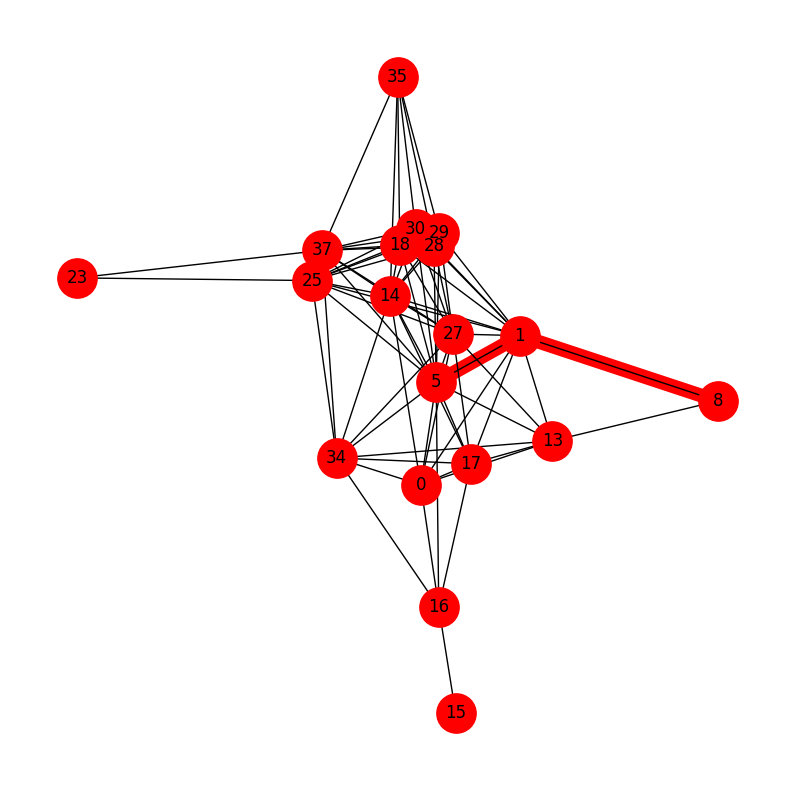

In [62]:
from pylab import *

#g = nx.karate_club_graph() 
#positions = nx.spring_layout(g)
gc=dist_graph.subgraph(max(nx.connected_components(dist_graph)))
fig = plt.figure("Shortest path", figsize=(10, 10))
path = nx.shortest_path(G, 5, 8)
edges = [(path[i], path[i+1]) for i in range(len(path) - 1)]
nx.draw_networkx_edges(gc, positions, edgelist = edges, edge_color = 'r', width = 10)
nx.draw(gc, positions, with_labels = True, node_color='r', node_size=800)
show()


In [63]:
nx.core_number(gc)

{0: 6,
 1: 8,
 5: 8,
 8: 2,
 13: 6,
 14: 8,
 15: 1,
 16: 4,
 17: 6,
 18: 8,
 23: 2,
 25: 8,
 27: 8,
 28: 8,
 29: 8,
 30: 8,
 34: 6,
 35: 6,
 37: 8}

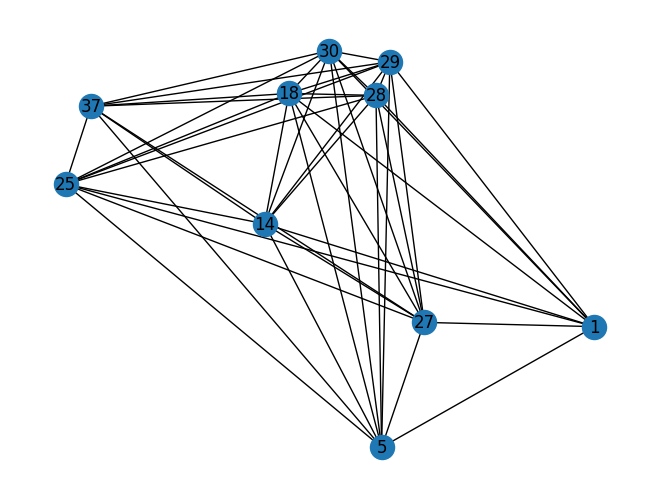

In [64]:
nx.draw(nx.k_core(gc), positions, with_labels = True) 
show()

# Prueba de pequeño mundo

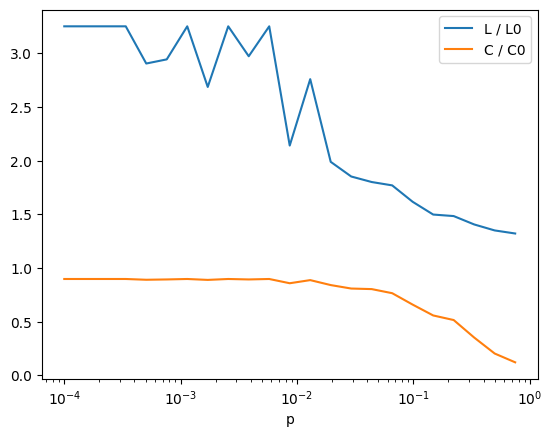

In [65]:
pdata = []
Ldata = []
Cdata = []
#g0 = nx.watts_strogatz_graph(1000, 10, 0) 
L0 = nx.average_shortest_path_length(gc)
C0 = nx.average_clustering(gc)
p = 0.0001 
while p < 1.0:
  g = nx.watts_strogatz_graph(100, 10, p)
  #g=dist_graph.subgraph(max(nx.connected_components(dist_graph))) 
  pdata.append(p)
  Ldata.append(nx.average_shortest_path_length(g) / L0) 
  Cdata.append(nx.average_clustering(g) / C0)
  p *= 1.5

semilogx(pdata, Ldata, label = 'L / L0')
semilogx(pdata, Cdata, label = 'C / C0')
xlabel('p')
legend()
show()

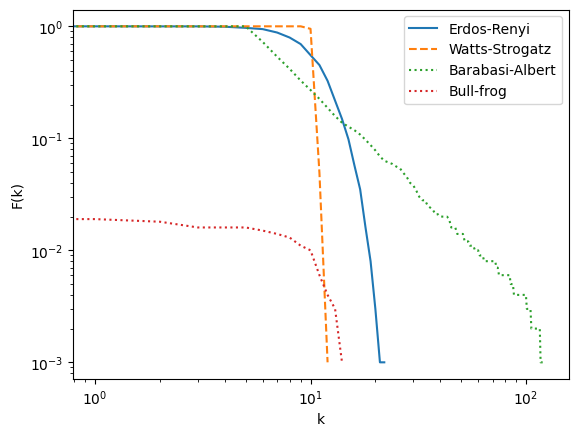

In [66]:
n = 1000
er = nx.erdos_renyi_graph(n, 0.01)
ws = nx.watts_strogatz_graph(n, 10, 0.01) 
ba = nx.barabasi_albert_graph(n, 5)

Pk = [float(x) / n for x in nx.degree_histogram(er)]
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, '-', label = 'Erdos-Renyi')

Pk = [float(x) / n for x in nx.degree_histogram(ws)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, '--', label = 'Watts-Strogatz')

Pk = [float(x) / n for x in nx.degree_histogram(ba)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, ':', label = 'Barabasi-Albert')

Pk = [float(x) / n for x in nx.degree_histogram(G)] 
domain = range(len(Pk))
ccdf = [sum(Pk[k:]) for k in domain]
loglog(domain, ccdf, ':', label = 'Bull-frog')

xlabel('k')
ylabel('F(k)')
legend()
show()

# Teoria Espectral de Grafos

 Eigenvalues
1.   



In [67]:
!pip install --upgrade scipy networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [68]:
knn_graph=G
A=nx.adjacency_matrix(knn_graph, nodelist=None, dtype=None, weight='weight')
A

<19x19 sparse array of type '<class 'numpy.float64'>'
	with 162 stored elements in Compressed Sparse Row format>

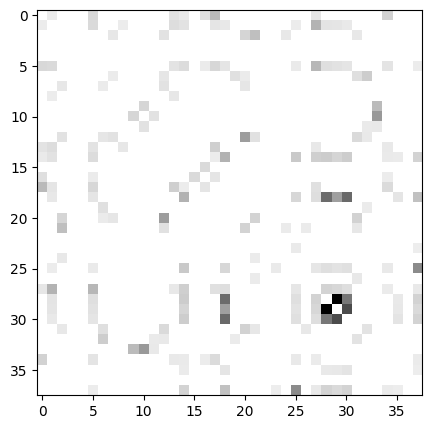

In [101]:
#Adjacency matrix
plt.figure(figsize=(10, 5))
A_adj = nx.adjacency_matrix(G)
A_adj = A_adj.todense()
plt.imshow(A_adj.T,cmap=cm.binary)
plt.show()

In [70]:
#print(A)

In [71]:
D = A.todense()
# Representación de una matriz densa
print(D)

[[   0.          163.40484894  332.39004853    0.          242.34777753
   178.80387498    0.          279.06184079  592.35696026    0.
     0.            0.          215.43943662    0.            0.
     0.          384.10308008    0.            0.        ]
 [ 163.40484894    0.          321.41362559  161.68664452  288.83192945
   251.47171975    0.            0.          225.65222797  197.4023116
     0.          162.57317215  639.73747704  234.21702858  223.09093156
   194.75063594    0.            0.            0.        ]
 [ 332.39004853  321.41362559    0.            0.          240.78915756
   304.33984274    0.          169.76906625  345.13427365  228.57106341
     0.          183.14057108  612.30910742  279.42681749  253.8938259
   225.02343373  236.93332314    0.          166.23081175]
 [   0.          161.68664452    0.            0.          208.75410256
     0.            0.            0.            0.            0.
     0.            0.            0.            0.        

In [72]:
lambdas=nx.adjacency_spectrum(knn_graph, weight='weight')
lambdas

array([ 5027.98016858+0.j,  1863.72212126+0.j, -2329.88393876+0.j,
         934.44726873+0.j, -1219.13067182+0.j,   477.98895934+0.j,
       -1052.01548223+0.j,  -776.52151329+0.j,  -757.52933293+0.j,
        -631.52143411+0.j,   176.92280209+0.j,   130.29540119+0.j,
          20.97888902+0.j,   -58.16729535+0.j,  -501.62191423+0.j,
        -431.08113118+0.j,  -234.7683474 +0.j,  -307.3631964 +0.j,
        -332.7313525 +0.j])

/usr/local/lib/python3.9/dist-packages/numpy/lib/histograms.py:852: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/usr/local/lib/python3.9/dist-packages/matplotlib/axes/_axes.py:6793: ComplexWarning: Casting complex values to real discards the imaginary part
  bins = np.array(bins, float)  # causes problems if float16


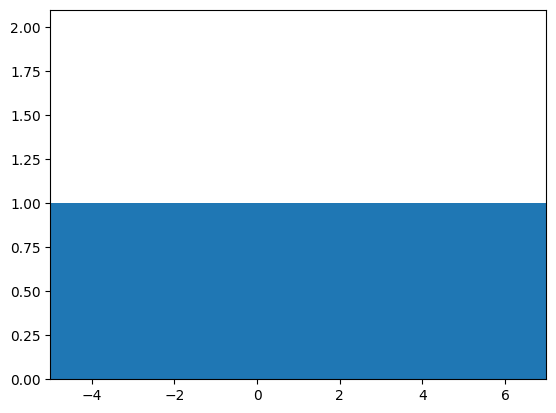

In [73]:
plt.hist(lambdas, bins=100)  # histogram with 100 bins
plt.xlim(-5, 7)  # eigenvalues between 0 and 2
plt.show()

In [74]:
lambdas.min()

(-2329.8839387552066+0j)

In [75]:
lambdas.max()

(5027.980168582121+0j)

In [76]:
#The spectral ordering of a graph is an ordering of its nodes where nodes in the same weakly connected components appear 
#contiguous and ordered by their corresponding elements in the Fiedler vector of the component.
nx.spectral_ordering(knn_graph, weight='weight', normalized=False, tol=1e-08, method='tracemin_pcg', seed=None)

[15, 16, 0, 17, 34, 5, 13, 27, 1, 14, 28, 29, 18, 30, 25, 37, 35, 8, 23]

Largest eigenvalue: 1.5666971112893713
Smallest eigenvalue: -1.1102230246251565e-16


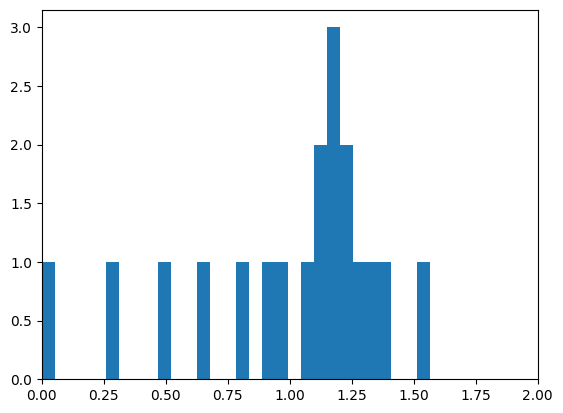

In [77]:
import numpy.linalg

L = nx.normalized_laplacian_matrix(G)
e = numpy.linalg.eigvals(L.toarray())
print("Largest eigenvalue:", max(e))
print("Smallest eigenvalue:", min(e))
plt.hist(e, bins=30)  # histogram with 100 bins
plt.xlim(0, 2)  # eigenvalues between 0 and 2
plt.show()

In [78]:
# M=nx.directed_modularity_matrix(G, nodelist=None, weight=None)
# M

In [79]:
# plt.figure(figsize=(20,10))
# plt.spy(M) 

In [80]:
#nx.average_shortest_path_length(knn_graph)

In [81]:
nx.shortest_path_length(knn_graph)

<generator object all_pairs_shortest_path_length at 0x7ff5229cdb30>

In [82]:
p=nx.shortest_path(dist_graph)
p

{0: {0: [0],
  1: [0, 1],
  5: [0, 5],
  13: [0, 13],
  14: [0, 14],
  16: [0, 16],
  17: [0, 17],
  27: [0, 27],
  34: [0, 34],
  8: [0, 1, 8],
  18: [0, 1, 18],
  25: [0, 1, 25],
  28: [0, 1, 28],
  29: [0, 1, 29],
  30: [0, 1, 30],
  37: [0, 5, 37],
  35: [0, 14, 35],
  15: [0, 16, 15],
  23: [0, 1, 25, 23]},
 1: {1: [1],
  0: [1, 0],
  5: [1, 5],
  8: [1, 8],
  13: [1, 13],
  14: [1, 14],
  17: [1, 17],
  18: [1, 18],
  25: [1, 25],
  27: [1, 27],
  28: [1, 28],
  29: [1, 29],
  30: [1, 30],
  16: [1, 0, 16],
  34: [1, 0, 34],
  37: [1, 5, 37],
  35: [1, 14, 35],
  23: [1, 25, 23],
  15: [1, 0, 16, 15]},
 2: {2: [2],
  7: [2, 7],
  12: [2, 12],
  20: [2, 20],
  21: [2, 21],
  24: [2, 24],
  31: [2, 31],
  6: [2, 7, 6],
  32: [2, 12, 32],
  26: [2, 21, 26],
  19: [2, 7, 6, 19],
  11: [2, 12, 32, 11],
  10: [2, 12, 32, 11, 10],
  33: [2, 12, 32, 11, 33],
  9: [2, 12, 32, 11, 10, 9]},
 3: {3: [3]},
 4: {4: [4]},
 5: {5: [5],
  0: [5, 0],
  1: [5, 1],
  13: [5, 13],
  14: [5, 14],
  16

In [83]:
#nx.shortest_path(knn_graph)


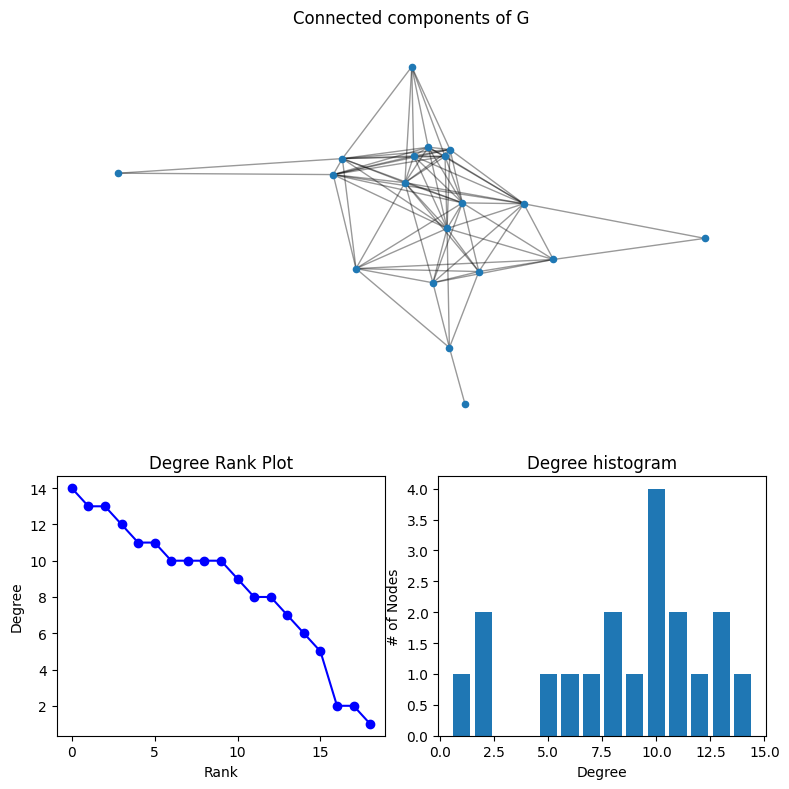

In [84]:
degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
dmax = max(degree_sequence)

fig = plt.figure("Degree of a random graph", figsize=(8, 8))
# Create a gridspec for adding subplots of different sizes
axgrid = fig.add_gridspec(5, 4)

ax0 = fig.add_subplot(axgrid[0:3, :])
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc, seed=2022)
nx.draw_networkx_nodes(Gcc, positions, ax=ax0, node_size=20)
nx.draw_networkx_edges(Gcc, positions, ax=ax0, alpha=0.4)
ax0.set_title("Connected components of G")
ax0.set_axis_off()

ax1 = fig.add_subplot(axgrid[3:, :2])
ax1.plot(degree_sequence, "b-", marker="o")
ax1.set_title("Degree Rank Plot")
ax1.set_ylabel("Degree")
ax1.set_xlabel("Rank")

ax2 = fig.add_subplot(axgrid[3:, 2:])
ax2.bar(*np.unique(degree_sequence, return_counts=True))
ax2.set_title("Degree histogram")
ax2.set_xlabel("Degree")
ax2.set_ylabel("# of Nodes")

fig.tight_layout()
plt.show()

In [85]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True) # used for degree distribution and powerlaw test

In [86]:
!pip install powerlaw
import powerlaw # Power laws are probability distributions with the form:p(x)∝x−α
fit = powerlaw.Fit(degree_sequence) 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Calculating best minimal value for power law fit


In [87]:
fit = powerlaw.Fit(degree_sequence, xmin=1)

<Axes: >

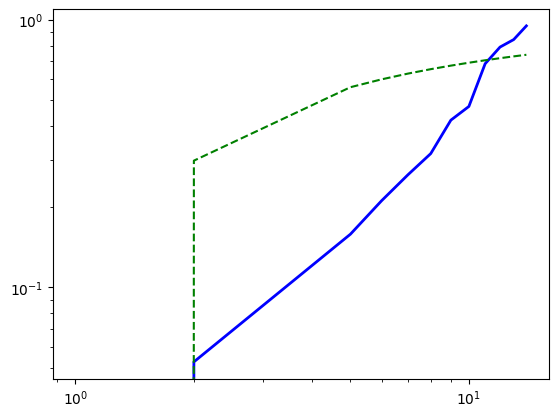

In [88]:
fig2 = fit.plot_cdf(color='b', linewidth=2)
fit.power_law.plot_cdf(color='g', linestyle='--', ax=fig2)

In [89]:
R, p = fit.distribution_compare('power_law', 'exponential', normalized_ratio=True)
print (R, p)

-4.3833283511230325 1.1687974571208802e-05


<Axes: >

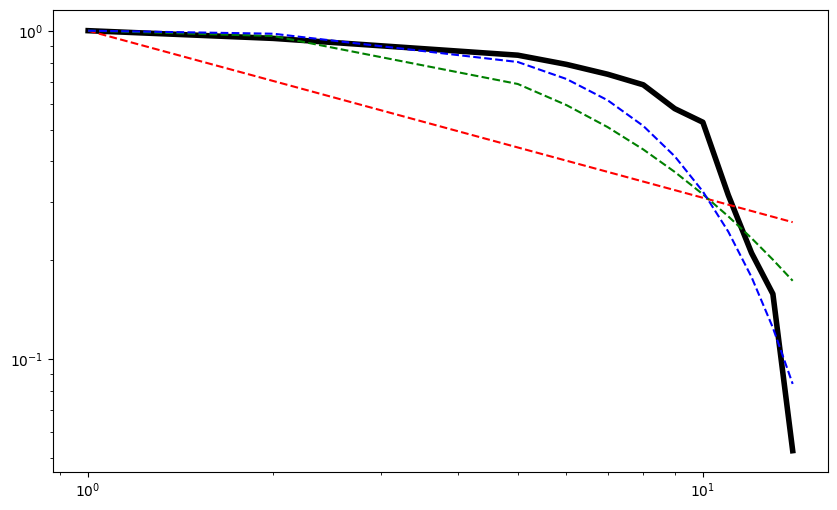

In [90]:
plt.figure(figsize=(10, 6))
fit.distribution_compare('power_law', 'lognormal')
fig4 = fit.plot_ccdf(linewidth=4, color='black')
fit.power_law.plot_ccdf(ax=fig4, color='r', linestyle='--') #powerlaw
fit.lognormal.plot_ccdf(ax=fig4, color='g', linestyle='--') #lognormal
fit.stretched_exponential.plot_ccdf(ax=fig4, color='b', linestyle='--') #stretched_exponential

In [91]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# for Notebook
%matplotlib inline

In [92]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.0001, linscale=1, base=10))
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [93]:
#G = nx.karate_club_graph()
G=dist_graph
pos = nx.spring_layout(G, seed=675)

In [94]:
DiG = nx.DiGraph()

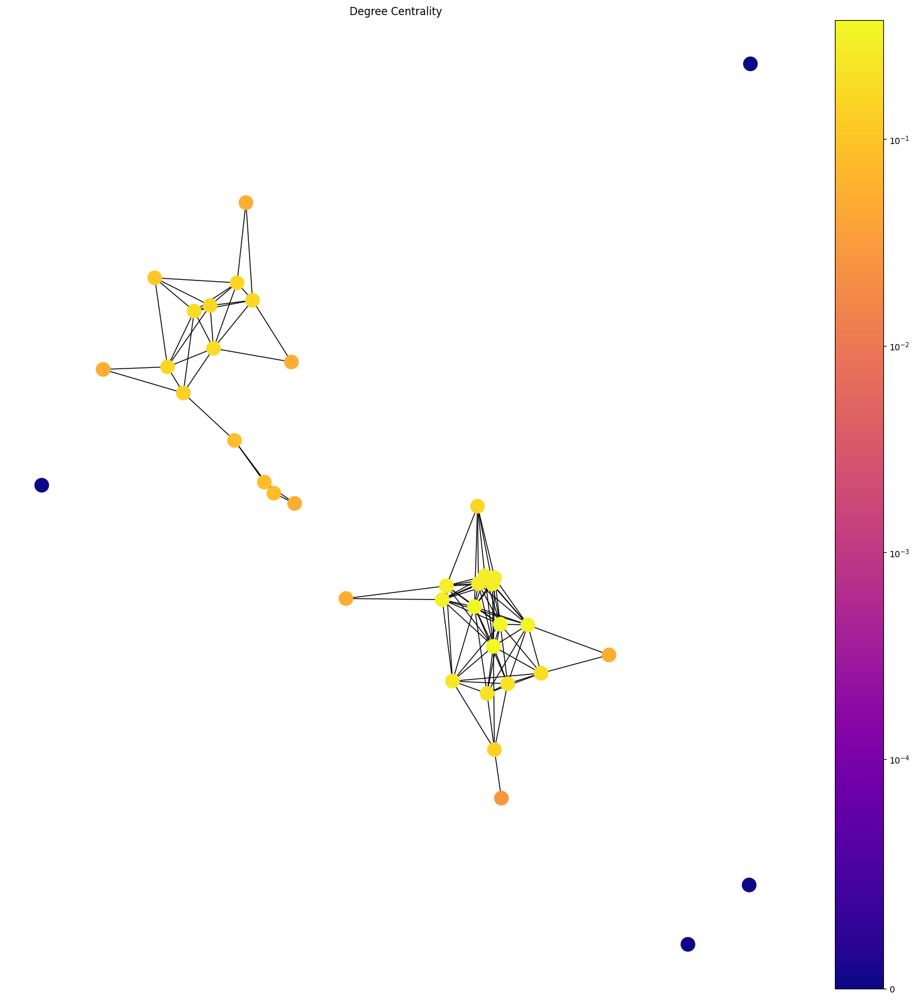

In [95]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.degree_centrality(G), 'Degree Centrality')

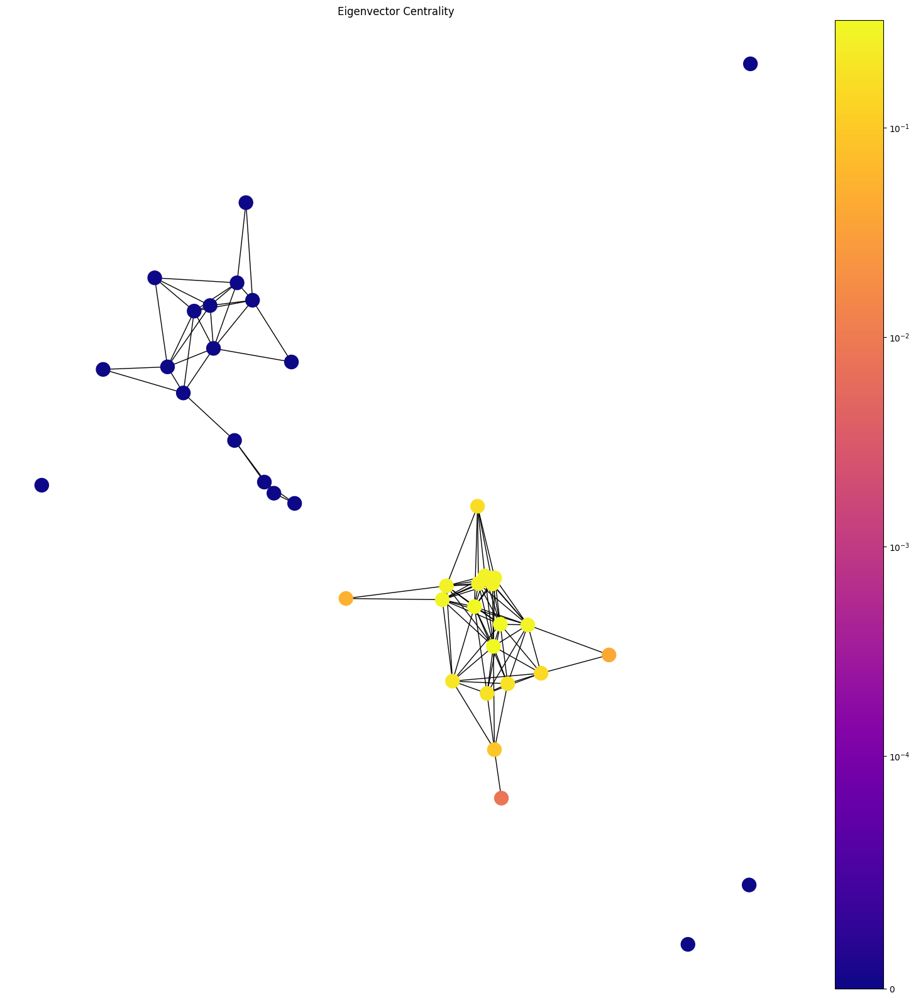

In [96]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.eigenvector_centrality_numpy(G), 'Eigenvector Centrality')

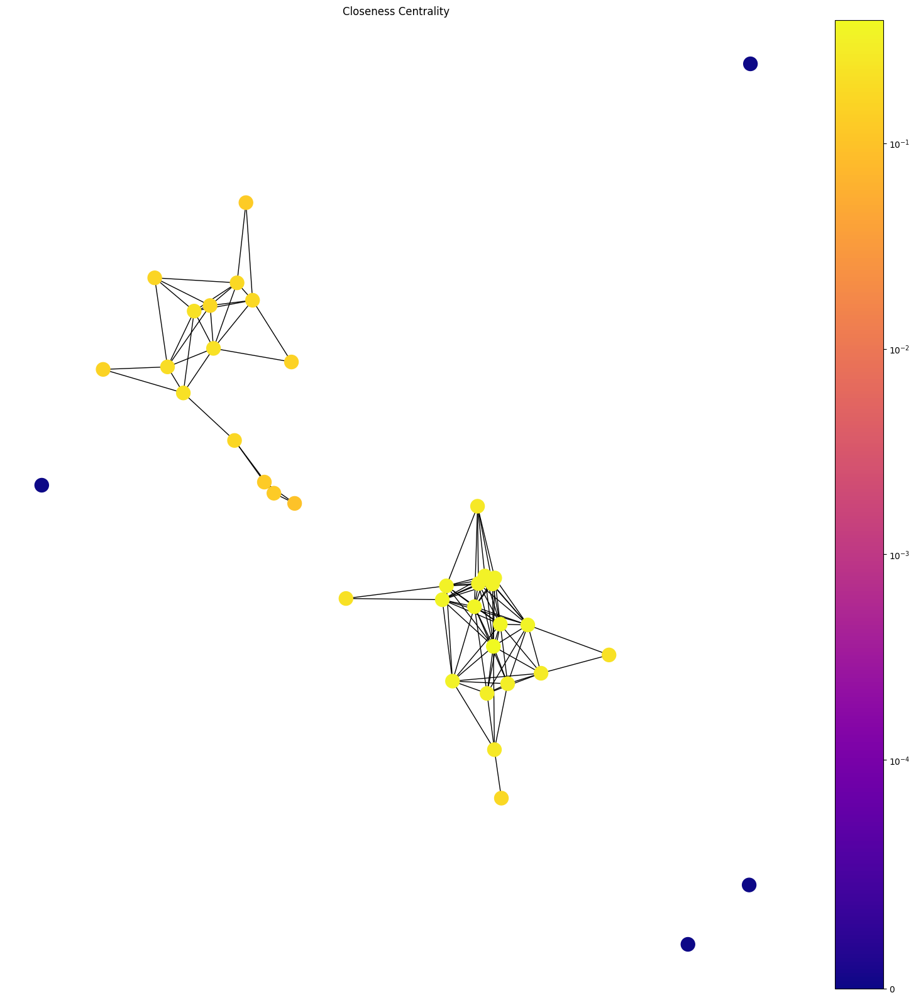

In [97]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.closeness_centrality(G), 'Closeness Centrality')

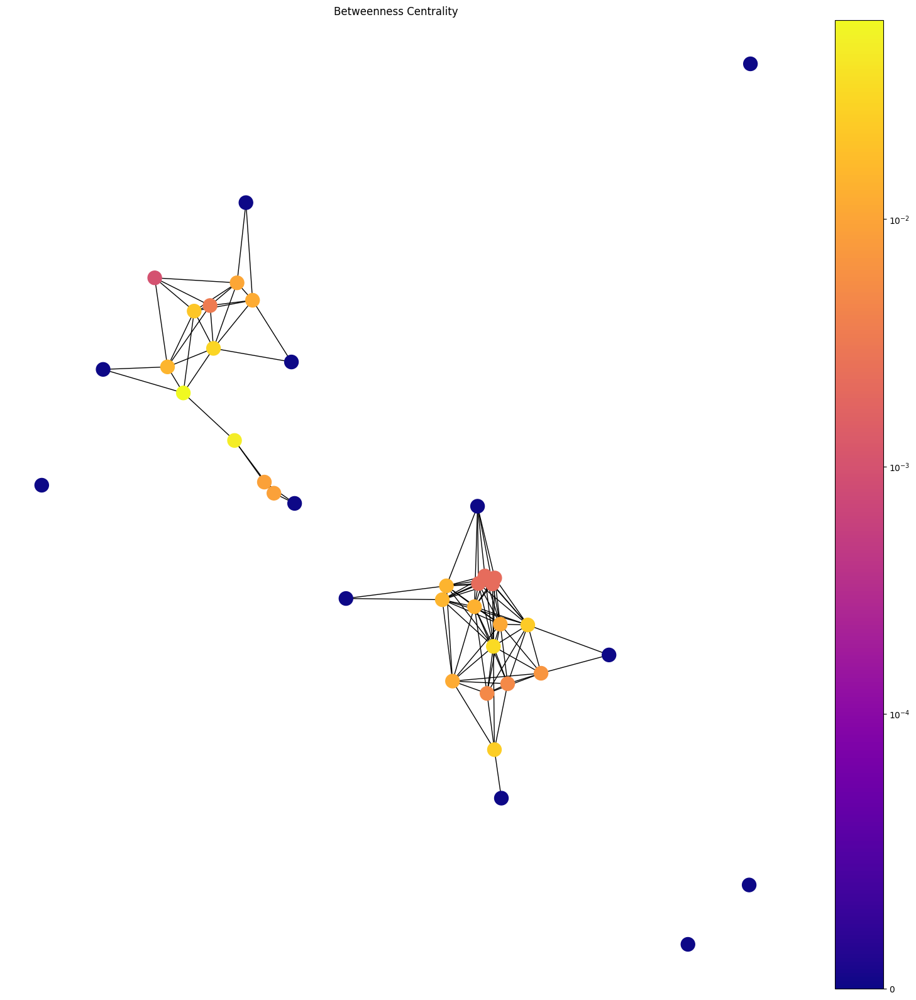

In [98]:
fig = plt.figure("Degree of a random graph", figsize=(20, 20))
draw(G, positions, nx.betweenness_centrality(G), 'Betweenness Centrality')

## Graficando metricas sobre el mapa

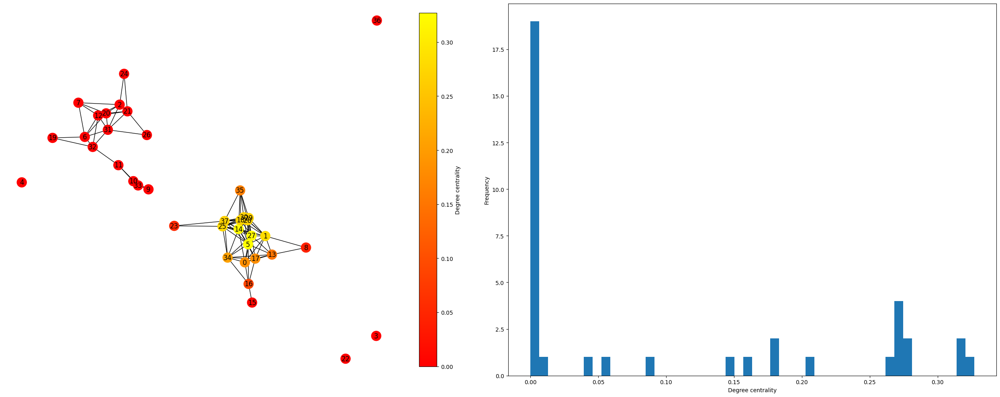

In [99]:
from matplotlib.cm import ScalarMappable
#gc=G.subgraph(max(nx.connected_components(G)))
lcc=nx.eigenvector_centrality_numpy(G)
#lcc= nx.degree_centrality(G)
#lcc = nx.clustering(G)
#lcc=nx.betweenness_centrality(G)
#lcc= nx.closeness_centrality(gc)
#lcc= nx.degree_centrality(gc)
#pos = nx.spring_layout(gc, seed=1)
cmap = plt.get_cmap('autumn')
norm = plt.Normalize(0, max(lcc.values()))
node_colors = [cmap(norm(lcc[node])) for node in G.nodes]

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(25, 10))

nx.draw(G, positions, node_color=node_colors, with_labels="Charco", ax=ax1)
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Degree centrality', shrink=0.95, ax=ax1)

ax2.hist(lcc.values(), bins=50)
ax2.set_xlabel('Degree centrality')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

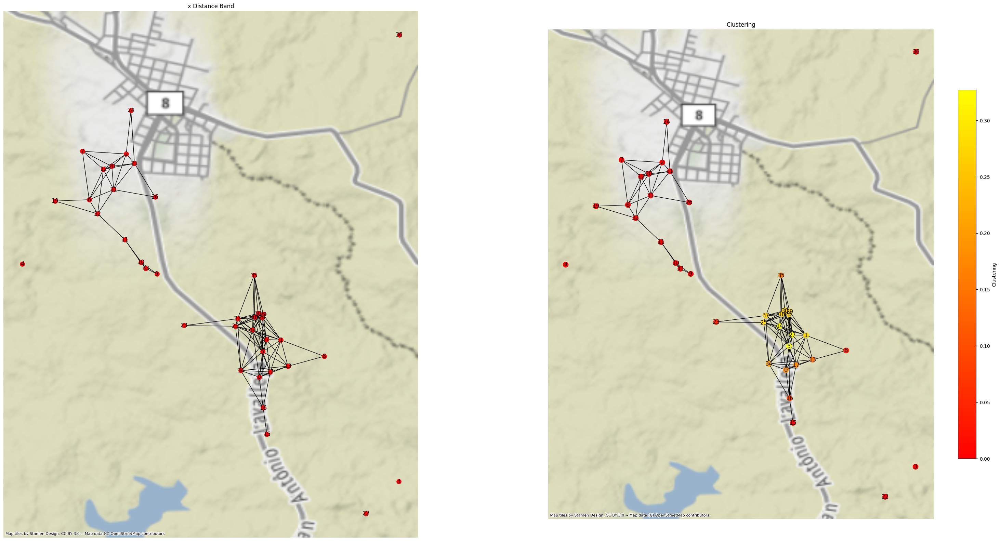

In [100]:
positions = dict(zip(dist_graph.nodes, coordinates_origen))
#positions=nx.spring_layout(knn_graph)
# plot with a nice basemap
f, ax = plt.subplots(1, 2, figsize=(40, 20))
for i, facet in enumerate(ax):
    df2.plot(marker=".",  alpha=1, color="k", ax=facet)
    add_basemap(facet, zoom=13, crs = df2.crs, url=ctx.providers.OpenStreetMap)
    facet.set_title(("x Distance Band", "Clustering" )[i])
    #facet.axis("off") 
nx.draw(G, positions, ax=ax[0], node_size=90, node_color="r", with_labels='Inv')
nx.draw(G, positions, ax=ax[1], node_size=120, node_color=node_colors, with_labels='Bullfrog_d')
fig.colorbar(ScalarMappable(cmap=cmap, norm=norm), label='Clustering', shrink=0.7, ax=ax[1])
plt.show()